# Clustering of clasroom sessions using a pair of words matrix

## Steps:
- Filtering words that are going to be used to build a matrix
- Build a matrix per session, where each row and column represents a word, and each cell represents the frequency of that pair of words appear in a sentence
- Use clustering algorithms to find 2 groups of clasroom sessions
- Measure the distance vector between the cluster's centroids
- Calculate the projection of each session into the distance vector
- Plot the projection of each session

### Defining preprocessing constants 

In [1]:
FILTER_STOP_WORDS = True
FILTER_BY_LENGTH = True
MIN_LENGTH = 30.0 #min
NORMALIZE_MATRIX_BY_LENGTH = True

In [87]:
import warnings
warnings.filterwarnings("ignore")


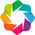

In [88]:
from __future__ import division
import string
import math
import os
import pandas as pd 
import numpy as np
import seaborn as sns
import nltk
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt, mpld3
import matplotlib.pylab as pylab
mpld3.enable_notebook()
import json
import unidecode
import pickle
from scipy import stats
from text_clustering import text_preprocessing as tp, word_connection_matrix as wcm, viz
import holoviews as hv
hv.extension('bokeh')

## 0. Import, paths y definitions

In [3]:
root_path = 'C:\Users\CATALINA ESPINOZA\Documents\clusters ciae'
data_path = os.path.join(root_path,'data')
output_path = os.path.join(root_path,'output')
by_grade_path = os.path.join(output_path,'textos_ulloa_by_curso')
by_grade_and_content = os.path.join(data_path,'textos_ulloa_by_grade_content')
by_content_path = os.path.join(output_path,'textos_ulloa_by_contenido')
all_files_path = os.path.join(data_path,'textos_ulloa')
all_classes = os.path.join(data_path,'clases_ulloa.txt')

#### Recover info of documents

In [4]:
all_documents_dict = tp.read_documents(all_files_path)

In [5]:
len(all_documents_dict)

56

In [3]:
with open(os.path.join(output_path,'pickles','document_length_dict.pickle'),'rb') as f:
    document_length = pickle.load(f)

NameError: name 'os' is not defined

In [7]:
dict_by_grade_and_content = tp.get_dict_files_with_grade_and_content(by_grade_and_content)

In [2]:
document_length

NameError: name 'document_length' is not defined

#### Describe selection of documents

In [8]:
document_length_filtered = {}
if FILTER_BY_LENGTH:
    filtered_documents = {}
    for document in all_documents_dict.keys():
        if document_length[document]>= MIN_LENGTH:
            document_length_filtered[document] = document_length[document]
            filtered_documents[document] = all_documents_dict[document]
    all_documents_dict = filtered_documents

In [9]:
token_set = tp.get_all_token_set(all_documents_dict)
print(len(token_set))

14208


In [10]:
frequency_per_word = tp.get_frequency_per_word(all_documents_dict,token_set)

In [11]:
len(frequency_per_word)

14208

In [12]:
zipped = zip(token_set,frequency_per_word)
zipped.sort(key = lambda t: t[1], reverse=True)

In [13]:
# TODO: ver que hace tokenize porque no entiendo como cambia tanto el resultado de las palabras 
# mas frecuentes
print("N, Palabra, Frecuencia ")
for i in range(len(zipped)):
    print(str(i)+", "+str(zipped[i][0])+", "+str(zipped[i][1]))

N, Palabra, Frecuencia 
0, la, 11997
1, que, 11809
2, de, 11260
3, el, 7310
4, a, 6144
5, es, 5319
6, y, 4738
7, lo, 4632
8, se, 4567
9, no, 4087
10, en, 3668
11, por, 3634
12, un, 3009
13, porque, 2544
14, una, 2496
15, va, 2386
16, si, 2333
17, o, 2179
18, los, 2157
19, con, 1987
20, qué, 1892
21, está, 1795
22, ya, 1705
23, del, 1651
24, fuerza, 1550
25, pero, 1533
26, eso, 1531
27, para, 1482
28, más, 1480
29, cuando, 1424
30, como, 1402
31, entonces, 1337
32, yo, 1335
33, las, 1251
34, le, 1126
35, al, 1118
36, puede, 1010
37, tiene, 975
38, te, 962
39, hacer, 930
40, luz, 928
41, usted, 915
42, cómo, 888
43, ejemplo, 880
44, su, 855
45, me, 852
46, sí, 839
47, hay, 819
48, ser, 798
49, son, 763
50, ver, 756
51, tengo, 732
52, forma, 715
53, hace, 694
54, ahora, 679
55, esto, 647
56, dos, 645
57, mayor, 644
58, campo, 634
59, solamente, 625
60, sea, 621
61, todo, 591
62, estoy, 584
63, voy, 569
64, hacia, 550
65, decir, 535
66, otro, 534
67, carga, 532
68, también, 526
69, velocid

1401, mamá, 17
1402, neta, 17
1403, módulo, 17
1404, programa, 17
1405, elasticidad, 17
1406, dijeron, 17
1407, caro, 17
1408, inclinación, 17
1409, desaparece, 17
1410, espejismo, 17
1411, condición, 17
1412, pregunto, 17
1413, señora, 17
1414, madre, 17
1415, quieras, 17
1416, lista, 17
1417, conversamos, 17
1418, producido, 17
1419, resta, 17
1420, núcleo, 17
1421, abril, 17
1422, medición, 17
1423, inclinado, 17
1424, recuerden, 17
1425, poca, 17
1426, sean, 17
1427, guarda, 17
1428, ciclo, 17
1429, pequeños, 17
1430, chica, 17
1431, descomposición, 17
1432, naturaleza, 17
1433, verte, 17
1434, aprender, 17
1435, explicación, 17
1436, rápidamente, 17
1437, llover, 17
1438, fórmula, 17
1439, magnitud, 17
1440, v, 17
1441, pone, 17
1442, resonancia, 17
1443, enchufe, 17
1444, jugar, 17
1445, nuevo, 17
1446, llevó, 17
1447, cama, 16
1448, unos, 16
1449, variable, 16
1450, mezcla, 16
1451, dinero, 16
1452, reflejado, 16
1453, ayuda, 16
1454, conectada, 16
1455, gravitacional, 16
1456, 

2901, buscando, 6
2902, avanza, 6
2903, anoche, 6
2904, mínimo, 6
2905, circulación, 6
2906, pulmones, 6
2907, levantando, 6
2908, manejar, 6
2909, mejorando, 6
2910, 300.000, 6
2911, alcanzó, 6
2912, trigonométricas, 6
2913, galaxia, 6
2914, bodega, 6
2915, activar, 6
2916, visualmente, 6
2917, guillermo, 6
2918, transforman, 6
2919, domingo, 6
2920, 600, 6
2921, ocurrió, 6
2922, you, 6
2923, tomé, 6
2924, nano, 6
2925, conectadas, 6
2926, kilogramos, 6
2927, vecino, 6
2928, porfa, 6
2929, cerveza, 6
2930, navidad, 6
2931, pasos, 6
2932, sismos, 6
2933, reflejarse, 6
2934, energética, 6
2935, cultura, 6
2936, parecer, 6
2937, jefe, 6
2938, lámina, 6
2939, arturo, 6
2940, resortes, 6
2941, 76, 6
2942, trata, 6
2943, programas, 6
2944, decían, 6
2945, iván, 6
2946, ecolocalizacion, 6
2947, apoyado, 6
2948, 64, 6
2949, supone, 6
2950, suponer, 6
2951, clara, 6
2952, quedé, 6
2953, formada, 6
2954, geometría, 6
2955, abuela, 6
2956, suya, 6
2957, ben, 6
2958, originalmente, 6
2959, confun

4400, sequías, 3
4401, proyectores, 3
4402, asociado, 3
4403, pérez, 3
4404, quemaduras, 3
4405, autor, 3
4406, durmiendo, 3
4407, lali, 3
4408, trucos, 3
4409, cristiano, 3
4410, diré, 3
4411, considerando, 3
4412, cerati, 3
4413, cq, 3
4414, lu, 3
4415, eduardo, 3
4416, laser, 3
4417, tenor, 3
4418, capítulo, 3
4419, padres, 3
4420, araña, 3
4421, gerador, 3
4422, economía, 3
4423, tantas, 3
4424, suspendida, 3
4425, clientes, 3
4426, presentan, 3
4427, aventuras, 3
4428, permitida, 3
4429, golpear, 3
4430, aceracion, 3
4431, llevarte, 3
4432, mero, 3
4433, muerte, 3
4434, ciber, 3
4435, wifi, 3
4436, complicaciones, 3
4437, buscarlo, 3
4438, deberías, 3
4439, cortando, 3
4440, tuya, 3
4441, quetzal, 3
4442, humanidad, 3
4443, acordar, 3
4444, regar, 3
4445, traslúcidos, 3
4446, afirmar, 3
4447, relojes, 3
4448, griega, 3
4449, rocío, 3
4450, intentaba, 3
4451, calendario, 3
4452, -10, 3
4453, derrame, 3
4454, contaminar, 3
4455, significan, 3
4456, significar, 3
4457, comisión, 3
44

5900, sumamos, 2
5901, observarse, 2
5902, taxi, 2
5903, frankie, 2
5904, lumen, 2
5905, excel, 2
5906, celula, 2
5907, lada, 2
5908, famosos, 2
5909, visitamos, 2
5910, moreno, 2
5911, diez, 2
5912, burbuja, 2
5913, asar, 2
5914, francia, 2
5915, flotar, 2
5916, anormal, 2
5917, divergentes, 2
5918, palma, 2
5919, iluminados, 2
5920, descomponerlo, 2
5921, atraído, 2
5922, barca, 2
5923, lol, 2
5924, ares, 2
5925, respec, 2
5926, brasier, 2
5927, describe, 2
5928, elemental, 2
5929, tirador, 2
5930, apoderado, 2
5931, magallanes, 2
5932, honestamente, 2
5933, evolucionando, 2
5934, inteligente, 2
5935, conecte, 2
5936, icono, 2
5937, vecina, 2
5938, decida, 2
5939, mandé, 2
5940, vero, 2
5941, recibimos, 2
5942, -5, 2
5943, -2, 2
5944, mundial, 2
5945, magdalena, 2
5946, meterlo, 2
5947, papeles, 2
5948, complica, 2
5949, aventurero, 2
5950, profecía, 2
5951, ayudan, 2
5952, deportivos, 2
5953, exceso, 2
5954, loma, 2
5955, mandaron, 2
5956, lagos, 2
5957, triángulos, 2
5958, quebrado

7399, agradecido, 1
7400, aprendió, 1
7401, erika, 1
7402, ahorrar, 1
7403, talkray, 1
7404, sueco, 1
7405, controlando, 1
7406, inflación, 1
7407, xvi, 1
7408, oceanis, 1
7409, mel, 1
7410, asesora, 1
7411, lamar, 1
7412, macroscópicas, 1
7413, artenativa, 1
7414, practicando, 1
7415, recuperó, 1
7416, diarrea, 1
7417, recuer, 1
7418, chicureo, 1
7419, concentrar, 1
7420, comunicó, 1
7421, breve, 1
7422, elegí, 1
7423, golpee, 1
7424, tortilleros, 1
7425, respeta, 1
7426, aventar, 1
7427, yakira, 1
7428, escalada, 1
7429, diferenciarlos, 1
7430, maraca, 1
7431, union, 1
7432, 107, 1
7433, afina, 1
7434, pastores, 1
7435, avisado, 1
7436, comedida, 1
7437, conocidas, 1
7438, obesa, 1
7439, rigola, 1
7440, obeso, 1
7441, 1011, 1
7442, medido, 1
7443, davo, 1
7444, desactiva, 1
7445, eliges, 1
7446, llanura, 1
7447, condensando, 1
7448, cardiología, 1
7449, 2515, 1
7450, premarin, 1
7451, derrotadas, 1
7452, a24, 1
7453, recubiertas, 1
7454, billares, 1
7455, acuesto, 1
7456, hidropo, 1


8899, ciao, 1
8900, cian, 1
8901, toso, 1
8902, bapi, 1
8903, superioridad, 1
8904, sarita, 1
8905, apretando, 1
8906, lescano, 1
8907, Águila, 1
8908, tecnológico, 1
8909, lija, 1
8910, const, 1
8911, dólares, 1
8912, versículo, 1
8913, divertir, 1
8914, cinemark, 1
8915, expuestos, 1
8916, regala, 1
8917, edward, 1
8918, comodato, 1
8919, conse, 1
8920, messenger, 1
8921, disidente, 1
8922, desalentado, 1
8923, aysén, 1
8924, quimioterapia, 1
8925, estupideces, 1
8926, sandías, 1
8927, retrocede, 1
8928, pique, 1
8929, multiplican, 1
8930, inversor, 1
8931, vaquetón, 1
8932, 299, 1
8933, galaxi, 1
8934, 295, 1
8935, domicilios, 1
8936, 290, 1
8937, cuatrimoto, 1
8938, huele, 1
8939, jessica, 1
8940, deprimente, 1
8941, cobrarle, 1
8942, recorriste, 1
8943, categorización, 1
8944, optimizar, 1
8945, desigualdad, 1
8946, corteza, 1
8947, bailó, 1
8948, soltó, 1
8949, revela, 1
8950, numerador, 1
8951, darles, 1
8952, senderos, 1
8953, compañías, 1
8954, danzas, 1
8955, axiales, 1
8956,

10398, niega, 1
10399, amortiguador, 1
10400, odiar, 1
10401, mancha, 1
10402, jerárquicamente, 1
10403, memes, 1
10404, potosí, 1
10405, prometiste, 1
10406, bandeja, 1
10407, 20,000, 1
10408, certero, 1
10409, geometra, 1
10410, salcedo, 1
10411, teclas, 1
10412, ligadas, 1
10413, recental, 1
10414, bordó, 1
10415, bomberos, 1
10416, balacera, 1
10417, obligaciones, 1
10418, rosedal, 1
10419, chiloé, 1
10420, regulados, 1
10421, sorprendido, 1
10422, consolidación, 1
10423, muertos, 1
10424, meridiano, 1
10425, paulatina, 1
10426, decodificar, 1
10427, envuelve, 1
10428, esparce, 1
10429, inconvenientes, 1
10430, crían, 1
10431, retracta, 1
10432, aprobados, 1
10433, botellazo, 1
10434, regalones, 1
10435, decirse, 1
10436, tapar, 1
10437, pampas, 1
10438, alargamiento, 1
10439, halal, 1
10440, anatomía, 1
10441, angustia, 1
10442, cristales, 1
10443, prohibiendo, 1
10444, lastimes, 1
10445, inviertan, 1
10446, vámonos, 1
10447, coxis, 1
10448, económicas, 1
10449, gallera, 1
10450, 

11898, montesinos, 1
11899, enfermera, 1
11900, valiente, 1
11901, steven, 1
11902, ontario, 1
11903, doctores, 1
11904, boret, 1
11905, lleguen, 1
11906, Éxodo, 1
11907, prudente, 1
11908, soldadores, 1
11909, sdp, 1
11910, siguiese, 1
11911, despejó, 1
11912, seria, 1
11913, inclu, 1
11914, baladas, 1
11915, vivas, 1
11916, subvención, 1
11917, aprontate, 1
11918, numéricos, 1
11919, magma, 1
11920, homenaje, 1
11921, valore, 1
11922, soldadura, 1
11923, georgette, 1
11924, fisionomía, 1
11925, correspondieron, 1
11926, curp, 1
11927, núm, 1
11928, betances, 1
11929, háblame, 1
11930, desidad, 1
11931, urgencia, 1
11932, cure, 1
11933, desordenado, 1
11934, curl, 1
11935, desordenada, 1
11936, lograría, 1
11937, pesó, 1
11938, oveja, 1
11939, irte, 1
11940, significativo, 1
11941, kira, 1
11942, parusía, 1
11943, artesanía, 1
11944, papi, 1
11945, gross, 1
11946, papa, 1
11947, representan, 1
11948, melián, 1
11949, heridos, 1
11950, germán, 1
11951, gallegos, 1
11952, esquiadores, 1

13397, replantear, 1
13398, 20001, 1
13399, categorizados, 1
13400, flan, 1
13401, bartola, 1
13402, componiendo, 1
13403, glorieta, 1
13404, piloto, 1
13405, plenamente, 1
13406, sentra, 1
13407, ilumine, 1
13408, quité, 1
13409, puma, 1
13410, aprobación, 1
13411, renata, 1
13412, dorita, 1
13413, evacuar, 1
13414, sobrecargo, 1
13415, cortesía, 1
13416, amber, 1
13417, gisela, 1
13418, horacio, 1
13419, comando, 1
13420, arantepacua, 1
13421, 612, 1
13422, 611, 1
13423, lighting, 1
13424, depositaron, 1
13425, abrirá, 1
13426, distraen, 1
13427, jova, 1
13428, magnetizado, 1
13429, carmelo, 1
13430, viajó, 1
13431, rolado, 1
13432, hamburguesa, 1
13433, manilla, 1
13434, olguín, 1
13435, negocios, 1
13436, avenue, 1
13437, anatema, 1
13438, antología, 1
13439, susceptible, 1
13440, altea, 1
13441, resort, 1
13442, dross, 1
13443, argentino, 1
13444, stephen, 1
13445, causados, 1
13446, hombro, 1
13447, botellas, 1
13448, inversiones, 1
13449, tocologia, 1
13450, party, 1
13451, xona

## 1. Filtering words

In [14]:
# get the most frequent words from the documents
set_300_most_frequent = tp.get_filter_by_number(token_set,frequency_per_word,300,FILTER_STOP_WORDS)
#set_less_frequent = tp.get_inverse_filter_by_number(token_set,frequency_per_word,300)
#filtered_documents_dict = tp.filter_by_set(all_documents_dict,set_less_frequent) #NO USAR

text_clustering\text_preprocessing.py:188: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if filter_stop_words and zipped[i][0] in stop_words_spanish:


## 2. Build pair of words matrices per session

In [4]:
#matrices_list,names_matrices = wcm.get_matrices(filtered_documents_dict,set_300_most_frequent)
matrices_list,names_matrices = wcm.get_matrices(all_documents_dict,set_300_most_frequent)
print(len(matrices_list))

NameError: name 'wcm' is not defined

Here is an example of one session represented as a pair of word matrix

<i>Note: Each cell represents the frequency of the relation of two words ($w_i \rightarrow w_j$). The diagonal measures the frequency of the word $w_i$</i>

In [16]:
matrix_example = pd.DataFrame(matrices_list[0])
matrix_example.columns = set_300_most_frequent
matrix_example.index = set_300_most_frequent
matrix_example

,va,si,qué,está,fuerza,más,entonces,puede,hacer,luz,...,central,caja,espacio,afuera,atmósfera,cualquier,vos,pueda,pequeña,partido
va,66.0,1.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
si,5.0,54.0,0.0,3.0,0.0,4.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
qué,3.0,2.0,24.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
está,5.0,0.0,1.0,54.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
fuerza,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
más,3.0,3.0,0.0,0.0,0.0,36.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
entonces,0.0,0.0,0.0,1.0,1.0,1.0,32.0,2.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
puede,0.0,0.0,2.0,3.0,0.0,2.0,0.0,29.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
hacer,3.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,32.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
luz,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Then, we check if we have to normalize the matrix

In [17]:
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list,document_length_filtered)
else:
    norm_matrices_list = matrices_list

Finally, we flatten the matrices into arrays

In [18]:
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)

## 3. Clustering matrices

In [19]:
n_kmeans = 2

(array([14.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 37.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

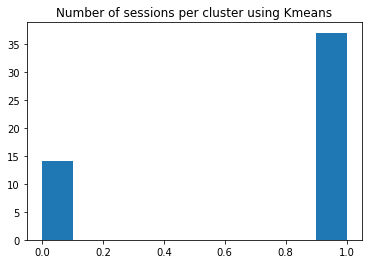

In [20]:
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
plt.title("Number of sessions per cluster using Kmeans")
plt.hist(labels_kmeans)

(array([ 8.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 43.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 10 Patch objects>)

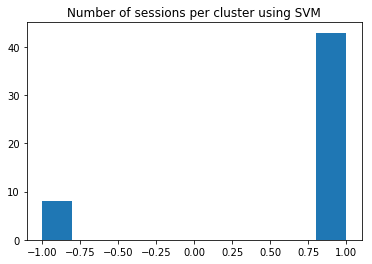

In [21]:
centers_svm,labels_svm = wcm.get_svm_clusters(norm_array_list)
plt.title("Number of sessions per cluster using SVM")
plt.hist(labels_svm)

## 4. Measure the distance between the clusters centroids

In [22]:
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
svm_axis = centers_svm[1] - centers_svm[0]

## 5. Matrices projection

In [23]:
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 
svm_indicator_matrices = map(lambda x: np.dot(x,svm_axis),norm_array_list)

## 6. Plot matrices by kmeans indicator

In [24]:
document_labels = tp.get_labels_by_document(names_matrices,dict_by_grade_and_content)

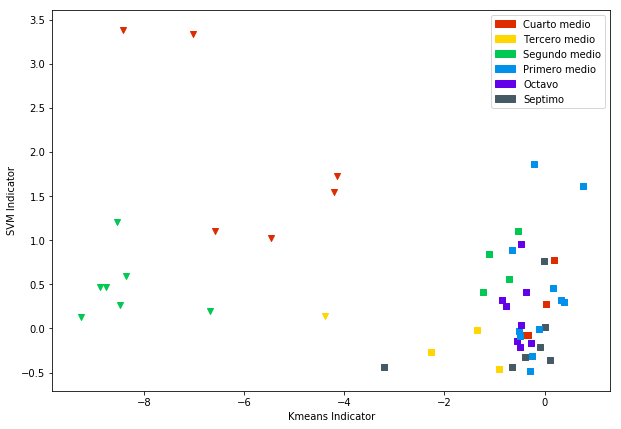

In [25]:
pylab.rcParams['figure.figsize'] = 10, 7
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matricesd,svm_indicator_matrices,labels_kmeans,'Kmeans Indicator','SVM Indicator',names_matrices,document_labels,'upper right')

Plotting session length vs kmeans indicator

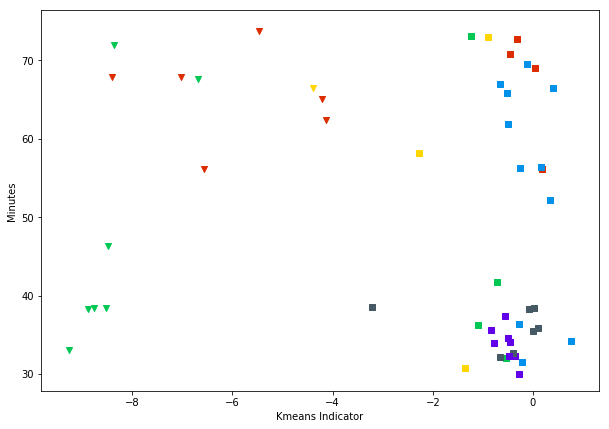

In [26]:
documents_length_audio = []
for i in range(len(kmeans_indicator_matrices)):
    name = names_matrices[i]
    documents_length_audio.append(document_length_filtered[name])
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,documents_length_audio,labels_kmeans,'Kmeans Indicator','Minutes',names_matrices,document_labels,None)

Plotting session length by number of words per session, colored by clusterization

In [27]:
documents_n_words = []
for i in range(len(kmeans_indicator_matrices)):
    name = names_matrices[i]
    documents_n_words.append(len(all_documents_dict[name].split()))

277694


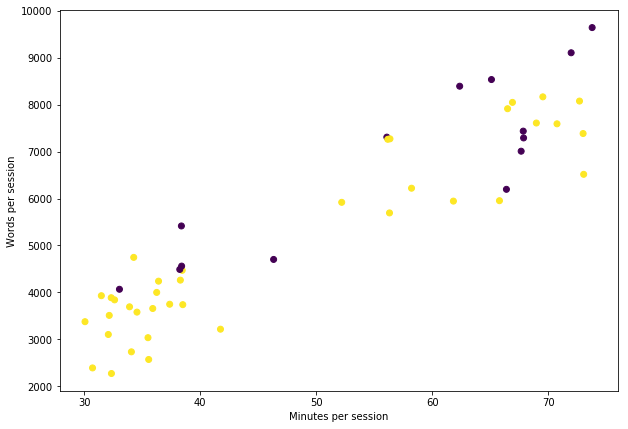

In [28]:
plt.xlabel('Minutes per session')
plt.ylabel('Words per session')
plt.scatter(documents_length_audio,documents_n_words,c=labels_kmeans)
print sum(documents_n_words)

Here we show the most frequent pair of words by lesson

Cluster 0

In [29]:
documents_pair_frequency = wcm.get_most_frequent_pairs(norm_array_list,10,len(set_300_most_frequent))
for c in range(len(labels_kmeans)):
    if labels_kmeans[c] == 0:
        elements = documents_pair_frequency[c]
        print "Document "+str(c)
        print "-------------------"
        for j in range(len(elements)):
            print str(set_300_most_frequent[elements[j][0]])+ " -> " + str(set_300_most_frequent[elements[j][1]])
        print "-------------------"

Document 0
-------------------
sé -> si
carga -> condensador
condensador -> carga
carga -> positiva
si -> carga
positivo -> negativo
va -> ser
carga -> voltaje
campo -> magnético
campo -> eléctrico
-------------------
Document 3
-------------------
velocidad -> campo
va -> fuerza
campo -> va
va -> hacia
si -> va
cómo -> va
si -> corriente
va -> corriente
va -> ser
campo -> magnético
-------------------
Document 8
-------------------
fuerza -> hacia
usted -> va
va -> ser
fuerza -> va
hacia -> derecha
va -> hacia
fuerza -> roce
fuerza -> normal
quiere -> decir
suma -> fuerzas
-------------------
Document 16
-------------------
quiere -> decir
carga -> campo
va -> campo
prueba -> carga
campo -> carga
carga -> negativa
si -> carga
carga -> positiva
carga -> prueba
campo -> eléctrico
-------------------
Document 18
-------------------
torque -> fuerza
cuerpo -> va
si -> usted
fuerza -> radio
tipo -> energía
puede -> ser
fuerza -> normal
va -> ser
fuerza -> roce
ejemplo -> fuerza
-----------

Cluster 1

In [30]:
documents_pair_frequency = wcm.get_most_frequent_pairs(norm_array_list,10,len(set_300_most_frequent))
for c in range(len(labels_kmeans)):
    if labels_kmeans[c] == 1:
        elements = documents_pair_frequency[c]
        print "Document "+str(c)
        print "-------------------"
        for j in range(len(elements)):
            print str(set_300_most_frequent[elements[j][0]])+ " -> " + str(set_300_most_frequent[elements[j][1]])
        print "-------------------"

Document 1
-------------------
poder -> hacer
hacer -> si
agua -> dentro
si -> está
luz -> dos
agua -> puede
qué -> va
agua -> turbina
qué -> hace
entonces -> ahí
-------------------
Document 2
-------------------
velocidad -> constante
10 -> 20
tiempo -> final
velocidad -> segundo
10 -> metros
aumenta -> velocidad
metros -> segundo
velocidad -> final
altura -> 10
velocidad -> tiempo
-------------------
Document 4
-------------------
qué -> sonido
aire -> más
más -> rápido
va -> mayor
sonido -> está
qué -> pasa
sonido -> puede
mayor -> temperatura
sonido -> va
va -> más
-------------------
Document 5
-------------------
diferencia -> presión
qué -> está
está -> pasando
si -> usted
0 -> grados
hoy -> día
medida -> va
masa -> aire
diferencia -> temperatura
masa -> agua
-------------------
Document 6
-------------------
menor -> mayor
parte -> luz
mayor -> ángulo
va -> ángulo
mayor -> menor
si -> ángulo
va -> depender
puede -> ser
si -> va
va -> ser
-------------------
Document 7
--------

## 7. Get cumulative distribution by pair of words by cluster

#### 7.1 Split matrices by cluster

In [31]:
matrices_cluster1 = []
matrices_cluster0 = []
for i in range(len(labels_kmeans)):
    if labels_kmeans[i]:
        matrices_cluster1.append(norm_array_list[i])
    else:
        matrices_cluster0.append(norm_array_list[i])        

#### 7.2 Transform the list of matrices into a list with list of pair of words frequency

In [32]:
w_ij_cluster1 = np.transpose(matrices_cluster1)
w_ij_cluster0 = np.transpose(matrices_cluster0)

For example:

$entonces \rightarrow fuerza$ ($w_{6,4}$)

índice 6*300+4 = 1804 

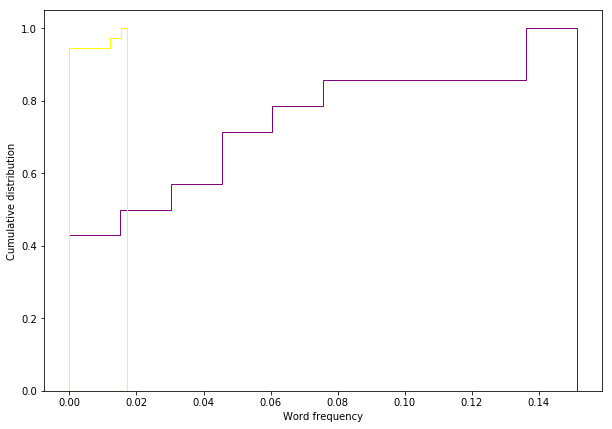

In [33]:
# plot the cumulative histogram
n, bins, patches = plt.hist(w_ij_cluster0[1804], normed=1, histtype='step',
                           cumulative=True, label='Empirical',color='purple')
n, bins, patches = plt.hist(w_ij_cluster1[1804], normed=1, histtype='step',
                           cumulative=True, label='Empirical',color='yellow')
plt.xlabel("Word frequency")
plt.ylabel("Cumulative distribution")
plt.show()

#### 7.3 Measure KS between the pair of words cumulative curves

In [34]:
ks_ij_clusters_1_0 = []
p_val_ks_ij_clusters_1_0 = []
for i in range(len(w_ij_cluster0)):
    ks = stats.ks_2samp(w_ij_cluster0[i],w_ij_cluster1[i])
    ks_ij_clusters_1_0.append(ks[0])
    p_val_ks_ij_clusters_1_0.append(ks[1])

For example, here is the KS of the combination of words $quiere \rightarrow decir$

In [35]:
ks_ij_clusters_1_0[(1804)]

0.7586872586872587

Here is the sample of pair of words in which the p_value of the ks was significative

319


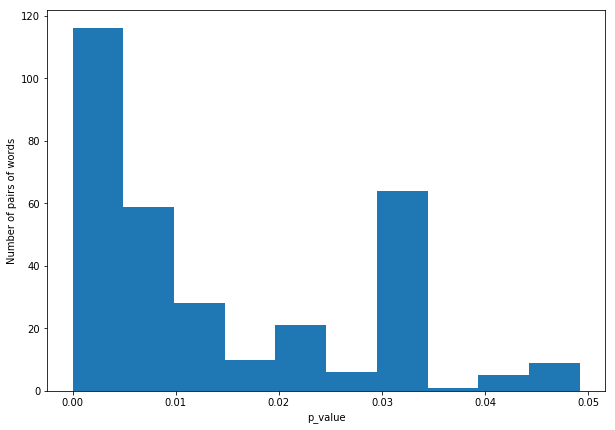

In [36]:
significative_p = filter(lambda x: x<0.05,p_val_ks_ij_clusters_1_0)
print(len(significative_p))
plt.hist(significative_p)
plt.xlabel("p_value")
plt.ylabel("Number of pairs of words")
plt.show()

## 8. Plotting KS matrix

In [37]:
pylab.rcParams['figure.figsize'] = 20, 12

In [38]:
ks_matrix = np.reshape(ks_ij_clusters_1_0,(300,300))
print wcm.check_symmetric(ks_matrix)

False


In [39]:
df = pd.DataFrame(ks_matrix)
df.columns = set_300_most_frequent
df.index = set_300_most_frequent

In [40]:
is_1 = lambda x: 1 if x > 0 else 0

In [41]:
reload(wcm)

<module 'text_clustering.word_connection_matrix' from 'text_clustering\word_connection_matrix.pyc'>

In [42]:
# count the number of documents in which the pair occurs
count_pair_c0 = map(lambda x: sum(map(is_1,x)),w_ij_cluster0)
count_pair_c1 = map(lambda x: sum(map(is_1,x)),w_ij_cluster1)
freq_pair_c0 = map(lambda x: sum(x),w_ij_cluster0)
freq_pair_c1 = map(lambda x: sum(x),w_ij_cluster1)


In [43]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
heatmap = hv.HeatMap(wcm.to_tuple(df,count_pair_c0,count_pair_c1,freq_pair_c0,freq_pair_c1),vdims=['KS','freq_in_documents_and_by_minute_cluster_0','freq_in_documents_and_by_minute_cluster_1'])
heatmap 

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Ranking ks

In [44]:
list_ks_sorted = np.argsort(np.ravel(ks_matrix))
sorted_pair_ij = wcm.get_word_pairs(list_ks_sorted,len(ks_matrix),len(ks_matrix))
zipped_pair_ij = zip(sorted_pair_ij[0],sorted_pair_ij[1])
flipped = np.flip(sorted_pair_ij,0)

In [45]:
diagonal = ks_matrix.diagonal()
diagonal_sort = np.argsort(diagonal)
diagonal_sort = np.flip(diagonal_sort,0)
for d in range(len(diagonal_sort)):
    if d < 20:
        print str(d)+") "+set_300_most_frequent[diagonal_sort[d]]+", ks:"+str(diagonal[diagonal_sort[d]])

0) fuerzas, ks:0.9459459459459459
1) fuerza, ks:0.8474903474903476
2) positivo, ks:0.7664092664092664
3) radio, ks:0.6872586872586873
4) dos, ks:0.6853281853281854
5) positiva, ks:0.6776061776061776
6) agua, ks:0.6583011583011583
7) negativo, ks:0.6505791505791506
8) esté, ks:0.6235521235521235
9) luz, ks:0.6216216216216216
10) ley, ks:0.613899613899614
11) hacia, ks:0.6061776061776062
12) carga, ks:0.5965250965250966
13) cero, ks:0.5945945945945946
14) quedar, ks:0.5772200772200773
15) hacer, ks:0.5772200772200773
16) torque, ks:0.5714285714285714
17) ser, ks:0.5694980694980695
18) masa, ks:0.5694980694980695
19) respecto, ks:0.5694980694980695


In [46]:
for i in range(len(flipped)):
    if i <20:
        print str(i)+") "+set_300_most_frequent[flipped[i][0]]+"->"+set_300_most_frequent[flipped[i][1]]+", ks: "+str(ks_matrix[flipped[i][0],flipped[i][1]])

0) fuerza->va, ks: 0.8745173745173745
1) fuerza->ser, ks: 0.8474903474903476
2) hacer->fuerza, ks: 0.8301158301158302
3) fuerza->hacer, ks: 0.8301158301158302
4) va->fuerza, ks: 0.8204633204633205
5) si->fuerza, ks: 0.803088803088803
6) fuerza->dos, ks: 0.7857142857142857
7) fuerza->está, ks: 0.7760617760617761
8) entonces->fuerza, ks: 0.7586872586872587
9) fuerza->igual, ks: 0.7586872586872587
10) fuerza->puede, ks: 0.7586872586872587
11) va->positivo, ks: 0.7586872586872587
12) qué->fuerza, ks: 0.7586872586872587
13) fuerza->si, ks: 0.7586872586872587
14) positivo->negativo, ks: 0.7490347490347491
15) fuerza->hacia, ks: 0.7316602316602316
16) mayor->fuerza, ks: 0.7316602316602316
17) más->fuerza, ks: 0.7316602316602316
18) va->ser, ks: 0.7297297297297297
19) fuerza->siempre, ks: 0.7142857142857143


## 9. Plot Kmeans indicator vs SVM indicator

In [47]:
#TODO: other filters, other clusterization, and plot in 3d
pylab.rcParams['figure.figsize'] = 10, 6

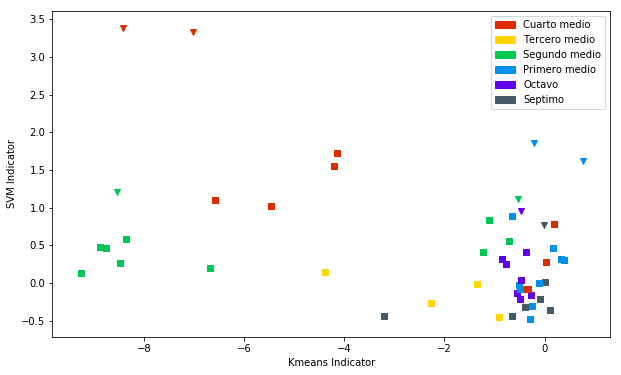

In [48]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,svm_indicator_matrices,labels_svm,'Kmeans Indicator','SVM Indicator',names_matrices,document_labels,'upper right')

## 10. Plotting using other filters

#### Filter by positive emotions

In [49]:
from text_clustering.text_preprocessing import *

In [50]:
labels_kmeans_all_words = labels_kmeans

In [51]:
n_kmeans = 2
clusters_max = [0,1]
# filtrar documentos con palabras
matrices_list_positive,names_matrices = wcm.get_matrices(all_documents_dict,set_emocional_positiva)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_positive,document_length_filtered)
else:
    norm_matrices_list = matrices_list_positive
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
positive_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

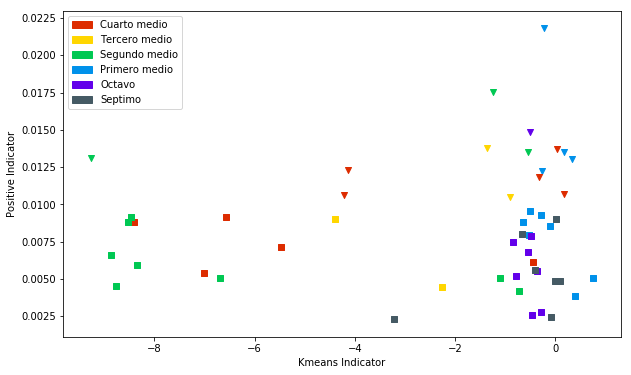

In [52]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,positive_indicator,labels_kmeans,'Kmeans Indicator','Positive Indicator',names_matrices,document_labels,'upper left')

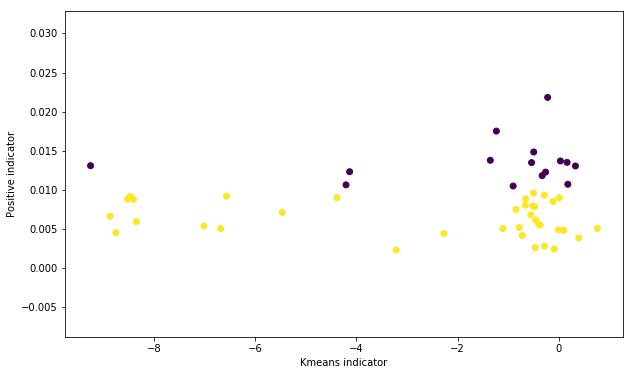

In [53]:
plt.scatter(kmeans_indicator_matrices,positive_indicator,c=labels_kmeans)
plt.ylabel("Positive indicator")
plt.xlabel("Kmeans indicator")
plt.show()

In [54]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_emocional_positiva)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_emocional_positiva)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Filter by negative words

In [55]:
# filtrar documentos con palabras
matrices_list_negative,names_matrices = wcm.get_matrices(all_documents_dict,set_emocional_negativa)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_negative,document_length_filtered)
else:
    norm_matrices_list = matrices_list_negative
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
negative_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

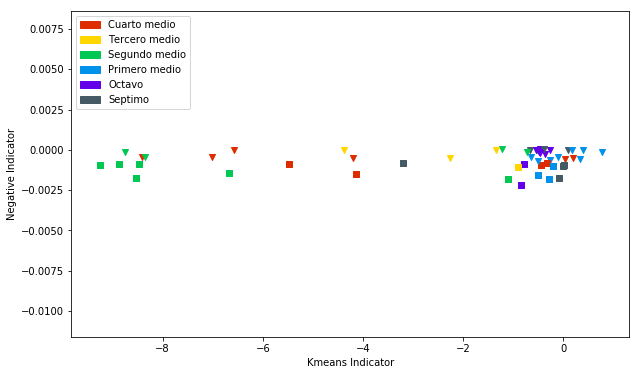

In [56]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,negative_indicator,labels_kmeans,'Kmeans Indicator','Negative Indicator',names_matrices,document_labels,'upper left')

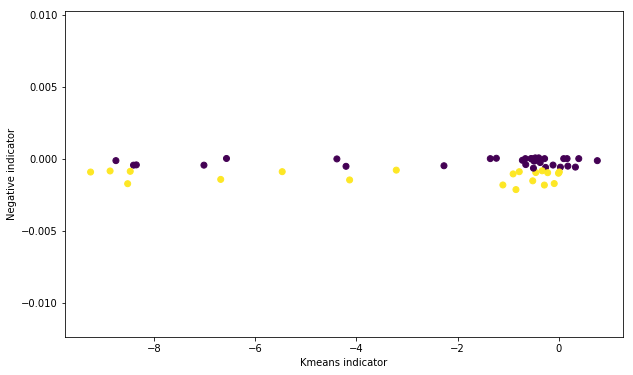

In [57]:
plt.scatter(kmeans_indicator_matrices,negative_indicator,c=labels_kmeans)
plt.ylabel("Negative indicator")
plt.xlabel("Kmeans indicator")
plt.show()

In [58]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_emocional_negativa)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_emocional_negativa)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Filter by expresive words

In [59]:
# filtrar documentos con palabras
matrices_list_expresive,names_matrices = wcm.get_matrices(all_documents_dict,set_expresion)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_expresive,document_length_filtered)
else:
    norm_matrices_list = matrices_list_expresive
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
expresive_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

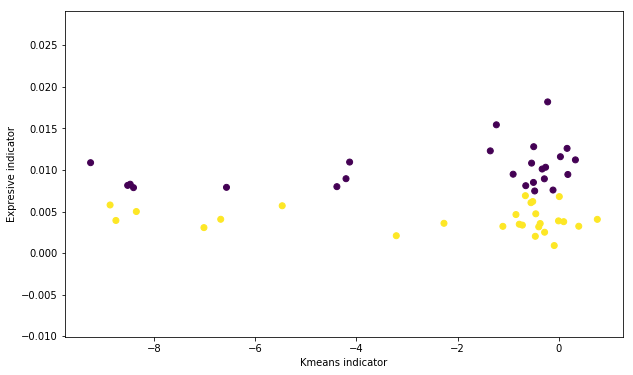

In [60]:
plt.scatter(kmeans_indicator_matrices,expresive_indicator,c=labels_kmeans)
plt.ylabel("Expresive indicator")
plt.xlabel("Kmeans indicator")
plt.show()

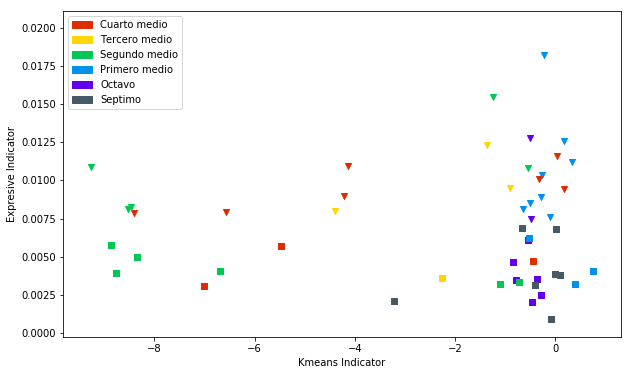

In [61]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,expresive_indicator,labels_kmeans,'Kmeans Indicator','Expresive Indicator',names_matrices,document_labels,'upper left')

In [62]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_expresion)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_expresion)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Filter by experimental words

In [63]:
# filtrar documentos con palabras
matrices_list_experimental,names_matrices = wcm.get_matrices(all_documents_dict,set_experimentos)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_experimental,document_length_filtered)
else:
    norm_matrices_list = matrices_list_experimental
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
experimental_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

There are some documents with low experimental indicator

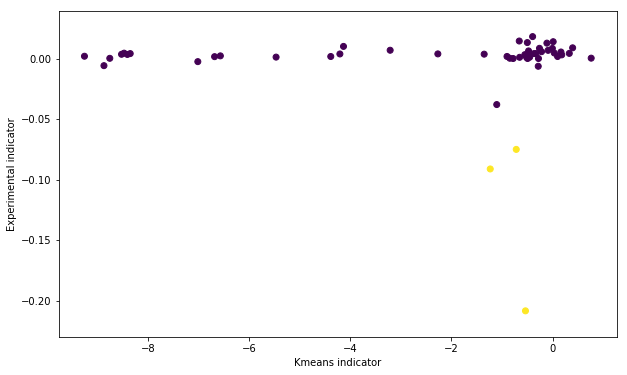

In [64]:
plt.scatter(kmeans_indicator_matrices,experimental_indicator,c=labels_kmeans)
plt.ylabel("Experimental indicator")
plt.xlabel("Kmeans indicator")
plt.show()

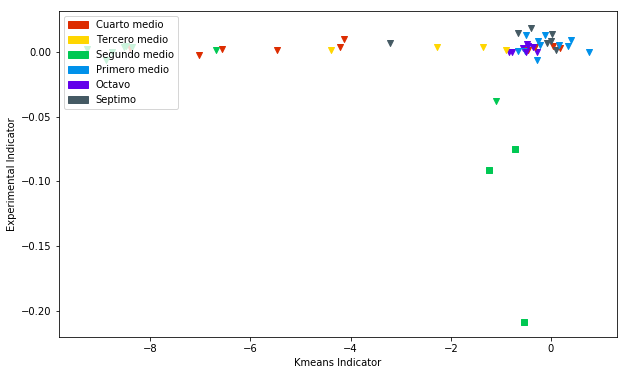

In [65]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,experimental_indicator,labels_kmeans,'Kmeans Indicator','Experimental Indicator',names_matrices,document_labels,'upper left')

<i>Note:</i> Using experimental words as a filter, the sessions related to uniformly accelerated motion are separated from the others.

In [66]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_experimentos)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_experimentos)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Filter by electric words

Apparently, electric words clustering is related with the overall clustering

In [67]:
# filtrar documentos con palabras
matrices_list_electrique,names_matrices = wcm.get_matrices(all_documents_dict,set_electricidad)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_electrique,document_length_filtered)
else:
    norm_matrices_list = matrices_list_electrique
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
electrique_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

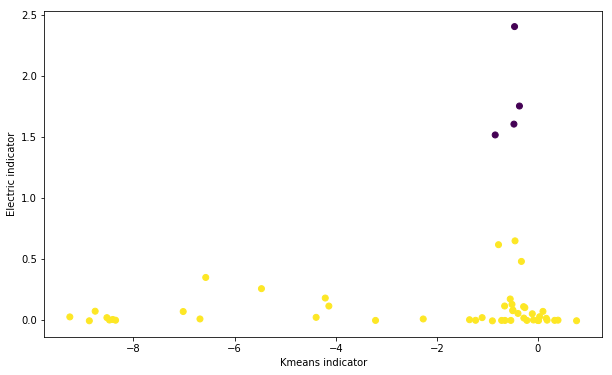

In [68]:
plt.scatter(kmeans_indicator_matrices,electrique_indicator,c=labels_kmeans)
plt.ylabel("Electric indicator")
plt.xlabel("Kmeans indicator")
plt.show()

 Which sessions are the ones with the electric indicator above 1.0?

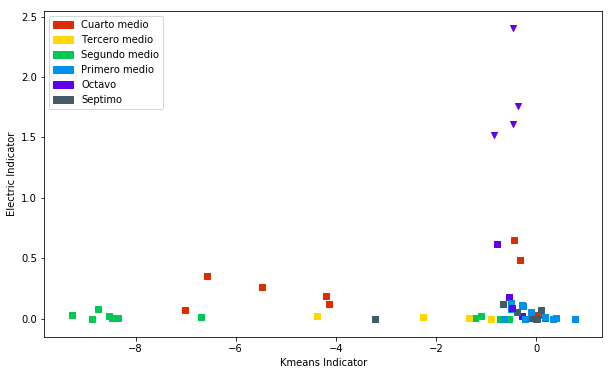

In [69]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,electrique_indicator,labels_kmeans,'Kmeans Indicator','Electric Indicator',names_matrices,document_labels,'upper left')

<i>Note:</i> Using experimental words as a filter, the sessions related to uniformly accelerated motion are separated from the others.

In [70]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_electricidad)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_electricidad)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Filter by questions

In [71]:
# filtrar documentos con palabras
matrices_list_questions,names_matrices = wcm.get_matrices_phrases(all_documents_dict,set_preguntas)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_questions,document_length_filtered)
else:
    norm_matrices_list = matrices_list_questions
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
questions_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

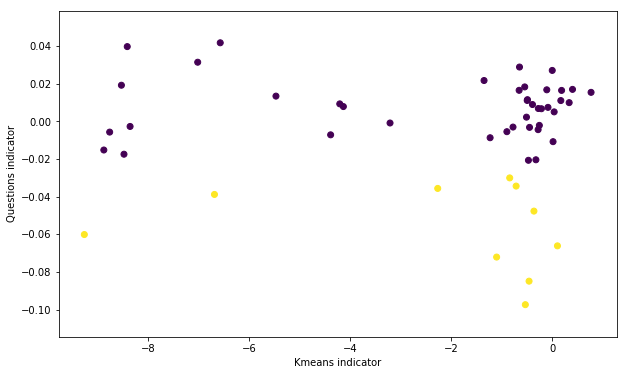

In [72]:
plt.scatter(kmeans_indicator_matrices,questions_indicator,c=labels_kmeans)
plt.ylabel("Questions indicator")
plt.xlabel("Kmeans indicator")
plt.show()

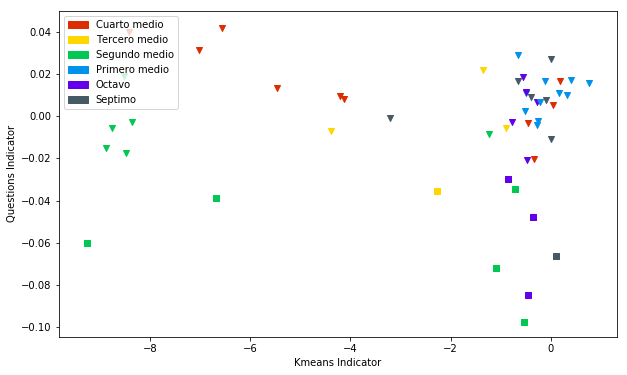

In [73]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,questions_indicator,labels_kmeans,'Kmeans Indicator','Questions Indicator',names_matrices,document_labels,'upper left')

In [74]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_preguntas)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_preguntas)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Filter by connective words

In [75]:
# filtrar documentos con palabras
matrices_list_conective,names_matrices = wcm.get_matrices_phrases(all_documents_dict,set_conectores)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_conective,document_length_filtered)
else:
    norm_matrices_list = matrices_list_conective
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
conective_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

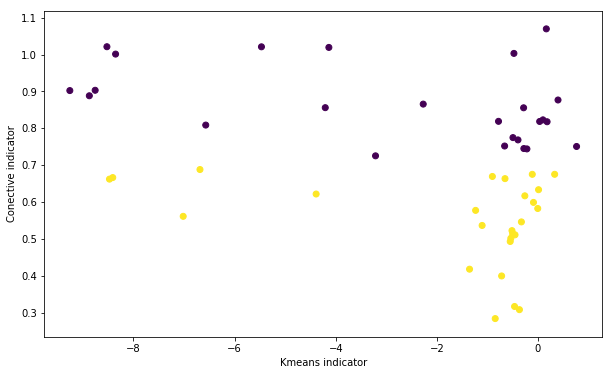

In [76]:
plt.scatter(kmeans_indicator_matrices,conective_indicator,c=labels_kmeans)
plt.ylabel("Conective indicator")
plt.xlabel("Kmeans indicator")
plt.show()

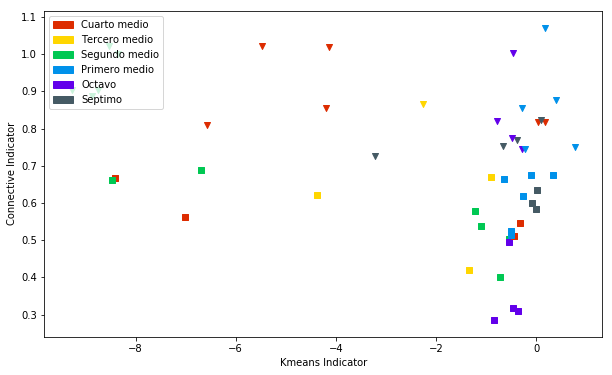

In [77]:
viz.scatter_plot_by_grade_by_cluster(kmeans_indicator_matrices,conective_indicator,labels_kmeans,'Kmeans Indicator','Connective Indicator',names_matrices,document_labels,'upper left')

In [78]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_conectores)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_conectores)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

### Plot indicators by different filters

In [79]:
len(questions_indicator)

51

In [80]:
df = pd.DataFrame(data= {'cluster':labels_kmeans_all_words,'I_question': questions_indicator,'I_experimental': experimental_indicator,'I_expresive': expresive_indicator,'I_positive': positive_indicator,'I_negative': negative_indicator, 'I_electrique': electrique_indicator,'I_connective': conective_indicator,'I_kmeans': kmeans_indicator_matrices},)

The figure below shows that there is no evident relation between the kmeans indicator and other indicators based in smaller groups of words. It can be seen also, that the sets "expressive" and "experimental" have 4 outliers in general. We can look for that documents to know what they are about

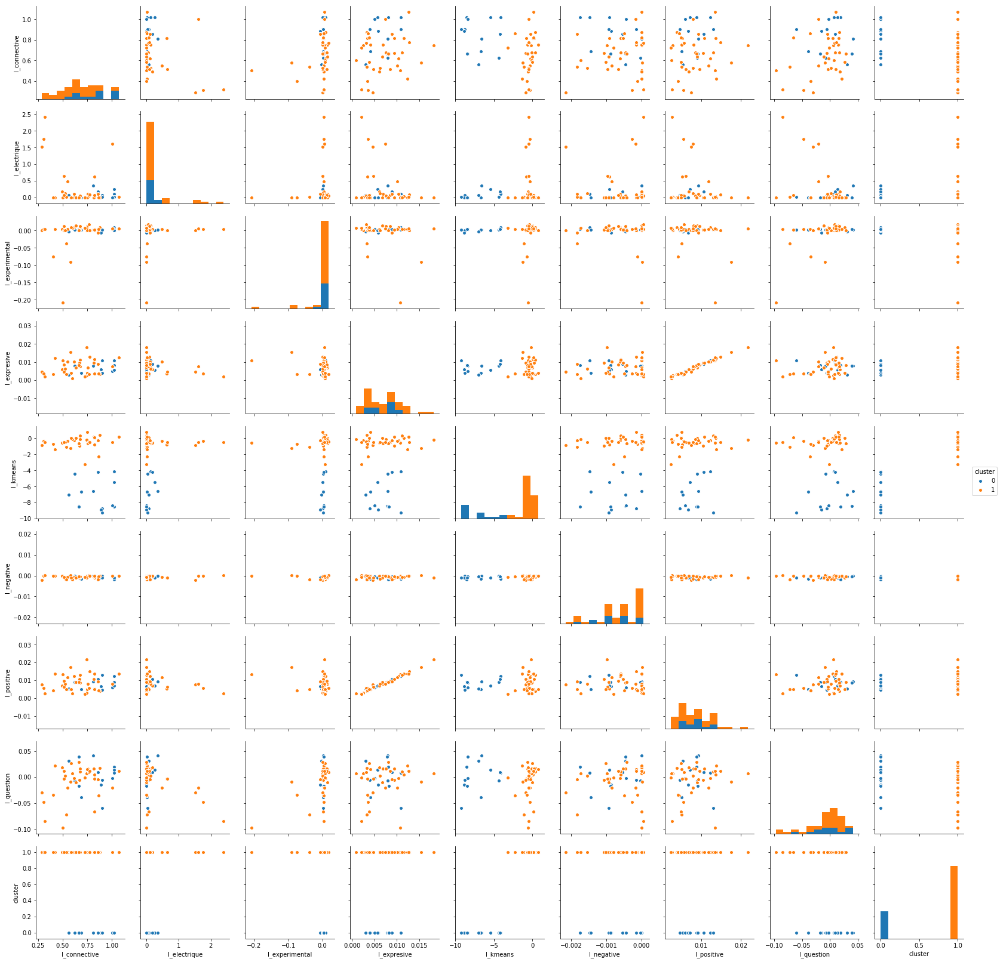

In [81]:
sns.pairplot(df, hue="cluster")

### Sacar matrix con todas palabras enzo

In [82]:
# filtrar documentos con palabras
# algunas palabras tienen dos palabras
matrices_filtered,names_matrices_filtered = wcm.get_matrices_phrases(all_documents_dict,set_all)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_filtered,document_length_filtered)
else:
    norm_matrices_list = matrices_filtered
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)

In [83]:
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
kmeans_axis = centers_kmeans[clusters_max[0]] - centers_kmeans[clusters_max[1]]
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list)
print wcm.check_symmetric(ks_matrix)

False


In [84]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)

#### Ranking KS

##### Ranking diagonal (over word frequency)

In [85]:
diagonal = ks_matrix.diagonal()
diagonal_sort = np.argsort(diagonal)
diagonal_sort = np.flip(diagonal_sort,0)
for d in range(len(diagonal_sort)):
    if d < 20:
        print str(d)+") "+set_all[diagonal_sort[d]]+", ks:"+str(diagonal[diagonal_sort[d]])

0) resistencia, ks:1.0
1) intensidad, ks:1.0
2) circuito, ks:0.9361702127659575
3) cuánto, ks:0.8297872340425532
4) porque, ks:0.8085106382978724
5) corriente, ks:0.8085106382978723
6) resultado, ks:0.7872340425531915
7) voltajes, ks:0.75
8) por ejemplo, ks:0.7287234042553191
9) corrientes, ks:0.7074468085106383
10) ejemplo, ks:0.6861702127659575
11) electricidad, ks:0.6223404255319149
12) ampolleta, ks:0.6223404255319149
13) pero, ks:0.5585106382978724
14) bien, ks:0.5531914893617021
15) material, ks:0.5319148936170213
16) cuándo, ks:0.5319148936170213
17) en cambio, ks:0.5319148936170213
18) medio, ks:0.5159574468085106
19) por otro lado, ks:0.5106382978723405


##### Ranking pair of words

In [86]:
list_ks_sorted = np.argsort(np.ravel(ks_matrix))
sorted_pair_ij = wcm.get_word_pairs(list_ks_sorted,len(ks_matrix),len(set_all))
zipped_pair_ij = zip(sorted_pair_ij[0],sorted_pair_ij[1])
flipped = np.flip(sorted_pair_ij,0)
for i in range(len(flipped)):
    if i <20:
        print str(i)+") "+set_all[flipped[i][0]]+"->"+set_all[flipped[i][1]]+", ks: "+str(ks_matrix[flipped[i][0],flipped[i][1]])

0) intensidad->resistencia, ks: 0.9787234042553191
1) intensidad->corriente, ks: 0.9574468085106383
2) pero->resistencia, ks: 0.75
3) resistencia->circuito, ks: 0.75
4) resistencia->intensidad, ks: 0.75
5) porque->electricidad, ks: 0.7287234042553191
6) por ejemplo->ejemplo, ks: 0.7287234042553191
7) circuito->resistencia, ks: 0.7287234042553191
8) en cambio->cambio, ks: 0.5319148936170213
9) es como->mal, ks: 0.5
10) relaci->intensidad, ks: 0.5
11) cómo->resistencia, ks: 0.5
12) pero->intensidad, ks: 0.5
13) después->bueno, ks: 0.5
14) resistencia->porque, ks: 0.5
15) resistencia->entonces, ks: 0.5
16) corriente->circuito, ks: 0.5
17) entonces->cuánto, ks: 0.5
18) ampolleta->también, ks: 0.5
19) resistencia->ampolleta, ks: 0.5
